In [93]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import os
import time
from IPython.display import clear_output  # 引入 clear_output
# torch.manual_seed(seed=42)  

os.makedirs("fun_images", exist_ok=True)


In [94]:
layer_num=3
hidden_num=64

class Mynetwork(nn.Module):
    def __init__(self,input_num=1 , out_num=1,hidden_num=64):
        super().__init__()
        self.MLP=nn.Sequential(
            nn.Linear(input_num, hidden_num),
            nn.ELU(),
            nn.Linear(hidden_num,hidden_num),
            nn.ELU(),
            nn.Linear(hidden_num,hidden_num),
            nn.ELU(),
            nn.Linear(hidden_num,out_num),
        )
        pass
    def forward(self,x):
        return self.MLP(x)+self.MLP(-x)

In [95]:
def potential(x):
    poten=(x-5)**2*(x+5)**2/25
    return poten

In [ ]:
#需要适当减小,x_M=sqrt(h_bar/(m*w)*(2n+1)),考虑要>10x_M,700sqrt(h_bar/\omega*m)
h_bar=1
m=1
b_lap:float=-h_bar**2/(2*m)

# 同时对于库伦势函数, 取e=1, 4\pi\epsilon_0=1, E_n=-1/(2n^2)
dtype=torch.float32
device=torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
os.makedirs(f'./model_para_{layer_num}_{hidden_num}_{dtype}', exist_ok=True)
La=-10
Lb =10
L=Lb-La  # domain length
N = 3000   # number of interior points # 对时间成本来说几乎是平方量级
h :float= L / (N+1)
grid=torch.linspace(La,Lb,N+2,dtype=dtype,device=device,requires_grad=True)
grid=grid[1:-1].unsqueeze(-1)

en_num=100
extend_num=0
epoch=5000
lr=0.01
# 先给出固定的矩阵元素
diag = -2.0 / h**2 * torch.ones(N,device=device) * b_lap
off_diag = 1.0 / h**2 * torch.ones(N - 1,device=device) * b_lap


/tmp/ipykernel_125092/2513471731.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


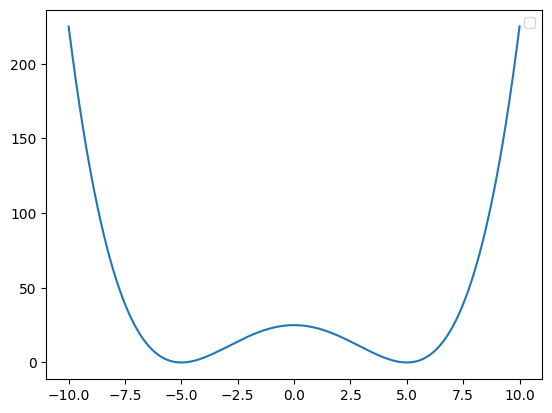

In [97]:
# 势函数演示图像
x_test=torch.linspace(La, Lb, N+2)
f1_test=potential(x_test)
plt.plot(x_test.numpy(), f1_test.numpy())
plt.legend()
plt.show()

In [98]:
# 计算初始的本征值
V_diag=potential(grid)
A = torch.diag(diag) + torch.diag(off_diag,diagonal=1) + torch.diag(off_diag, diagonal=-1)+torch.diag(V_diag.flatten())
eigenvalues= torch.linalg.eigvalsh(A)

print('initial eigenvalues check:')
print(eigenvalues[:en_num])

initial eigenvalues check:
tensor([  1.4046,   1.4046,   4.1698,   4.1699,   6.8702,   6.8705,   9.4978,
          9.4982,  12.0482,  12.0485,  14.5138,  14.5139,  16.8809,  16.8811,
         19.1375,  19.1378,  21.2594,  21.2596,  23.1991,  23.2010,  24.7072,
         25.0179,  26.0326,  26.8456,  27.8305,  28.8522,  29.9303,  31.0535,
         32.2173,  33.4216,  34.6603,  35.9339,  37.2383,  38.5752,  39.9407,
         41.3361,  42.7576,  44.2067,  45.6808,  47.1806,  48.7047,  50.2537,
         51.8240,  53.4187,  55.0342,  56.6731,  58.3321,  60.0125,  61.7123,
         63.4338,  65.1734,  66.9339,  68.7118,  70.5101,  72.3254,  74.1603,
         76.0112,  77.8818,  79.7676,  81.6726,  83.5923,  85.5304,  87.4832,
         89.4539,  91.4390,  93.4413,  95.4580,  97.4909,  99.5385, 101.6013,
        103.6784, 105.7710, 107.8775, 109.9987, 112.1339, 114.2829, 116.4461,
        118.6227, 120.8132, 123.0167, 125.2343, 127.4646, 129.7083, 131.9642,
        134.2338, 136.5155, 138.8100,

In [99]:
######----------------------------------------------
real_en=eigenvalues[:en_num].detach()
######----------------------------------------------

In [100]:
model=Mynetwork().to(device=device,dtype=dtype)
optimizer=torch.optim.Adam(model.parameters(),lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,patience=20,threshold=1e-4)
loss_fn=nn.MSELoss()

loss_list=[]
init_time=time.time()
for i in range(epoch):
    optimizer.zero_grad()
    V_diag=model(grid)
    A = torch.diag(diag) + torch.diag(off_diag,diagonal=1) + torch.diag(off_diag, diagonal=-1)+torch.diag(V_diag.flatten())
    eigenvalues= torch.linalg.eigvalsh(A)

    print('\nepoch:',i)
    print(eigenvalues[:en_num+extend_num])
    print(real_en)
    
    output=eigenvalues[:en_num]
    
    val_loss=loss_fn(output,real_en)
    loss=val_loss
    loss.backward()
    optimizer.step()
    
    loss_list.append(loss.item())
    
    os.makedirs(f'./fun_images/V_{La}_{Lb}_{N}_{en_num}', exist_ok=True)
    torch.save(V_diag,f'./fun_images/V_{La}_{Lb}_{N}_{en_num}/V_diag_{i}.pth')
    
    if i%10==0:
        # clear_output(wait=True)
        print(f'epoch:{i},loss:{loss},time:{time.time()-init_time},lr:{optimizer.param_groups[0]["lr"]}')
    if (i+1)%100==0:torch.save(model.state_dict(),f'./model_para_{layer_num}_{hidden_num}_{dtype}/model_para_use_eigvalues_{en_num}_La{La}_Lb{Lb}_N{N}.pth')
    
    scheduler.step(loss)
    if optimizer.param_groups[0]["lr"] <= 1.1e-8:break
print('terminal epoch: ',i+1)
torch.save(model.state_dict(),f'./model_para_{layer_num}_{hidden_num}_{dtype}/model_para_use_eigvalues_{en_num}_La{La}_Lb{Lb}_N{N}.pth')



epoch: 0
tensor([5.2065e-02, 9.3005e-02, 1.9235e-01, 2.2373e-01, 3.6403e-01, 4.9257e-01,
        6.5566e-01, 8.4238e-01, 1.0537e+00, 1.2847e+00, 1.5457e+00, 1.8278e+00,
        2.1363e+00, 2.4703e+00, 2.8284e+00, 3.2098e+00, 3.6173e+00, 4.0490e+00,
        4.5054e+00, 4.9868e+00, 5.4926e+00, 6.0229e+00, 6.5777e+00, 7.1575e+00,
        7.7623e+00, 8.3914e+00, 9.0450e+00, 9.7239e+00, 1.0426e+01, 1.1154e+01,
        1.1907e+01, 1.2684e+01, 1.3485e+01, 1.4313e+01, 1.5163e+01, 1.6038e+01,
        1.6939e+01, 1.7864e+01, 1.8814e+01, 1.9789e+01, 2.0787e+01, 2.1810e+01,
        2.2859e+01, 2.3932e+01, 2.5029e+01, 2.6152e+01, 2.7299e+01, 2.8470e+01,
        2.9667e+01, 3.0888e+01, 3.2133e+01, 3.3403e+01, 3.4698e+01, 3.6017e+01,
        3.7361e+01, 3.8730e+01, 4.0123e+01, 4.1541e+01, 4.2983e+01, 4.4451e+01,
        4.5942e+01, 4.7459e+01, 4.9000e+01, 5.0565e+01, 5.2156e+01, 5.3771e+01,
        5.5410e+01, 5.7074e+01, 5.8763e+01, 6.0476e+01, 6.2214e+01, 6.3977e+01,
        6.5764e+01, 6.7576e+01

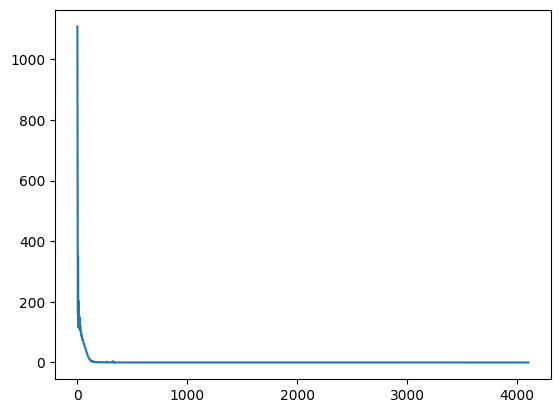

In [101]:
plt.plot(loss_list)
plt.show()

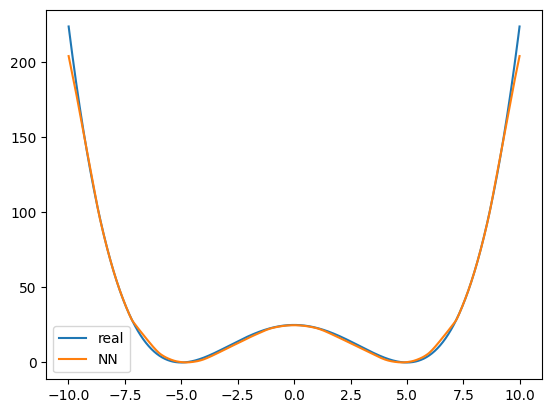

In [102]:
La=-10
Lb =10
L=Lb-La  # domain length
N = 2000   # number of interior points # 对时间成本来说几乎是平方量级
h :float= L / (N+1)
grid=torch.linspace(La,Lb,N+2,dtype=dtype,device=device)
grid=grid[1:-1].unsqueeze(-1)
V_NN=model(grid)
V_NN=V_NN.cpu().detach().numpy()
real_poten=potential(grid.cpu().detach().numpy())
plt.plot(grid.cpu().detach().numpy(),real_poten,label='real')
plt.plot(grid.cpu().detach().numpy(),V_NN,label='NN')
plt.legend()
plt.show()

In [103]:
# os.makedirs(f'./V_NN_value_{sym}_{layer_num}_{hidden_num}_{dtype}', exist_ok=True)
# torch.save(V_NN,f'./V_NN_value_{sym}_{layer_num}_{hidden_num}_{dtype}/V_NN_use_eigvalues_{en_num}_La{La}_Lb{Lb}_N{N}.pth')

In [104]:
error=V_NN-real_poten
mean_error=np.mean(np.abs(error))
max_error=np.max(np.abs(error))
print('mean_error:',mean_error)
print('max_error:',max_error)

mean_error: 1.3568122
max_error: 19.717407
